* Trigger word detection is the technology that allows devices like Amazon Alexa, Google Home, Apple Siri, and Baidu DuerOS to wake up upon hearing a certain word.  
* Trigger word will be "activate". Every time it hears we say "activate", it will make a "chiming" sound. I used activate because making a new dataset is a bit complex task.  


In [1]:
%cd /content/drive/MyDrive/Triggerred word

/content/drive/MyDrive/Triggerred word


In [2]:
!pip install pydub
!pip install scipy

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [3]:
import matplotlib.pyplot as plt
from scipy.io import wavfile
import os
from pydub import AudioSegment

# Calculate and plot spectrogram for a wav audio file
def graph_spectrogram(wav_file):
    rate, data = get_wav_info(wav_file)
    nfft = 200 # Length of each window segment
    fs = 8000 # Sampling frequencies
    noverlap = 120 # Overlap between windows
    nchannels = data.ndim
    if nchannels == 1:
        pxx, freqs, bins, im = plt.specgram(data, nfft, fs, noverlap = noverlap)
    elif nchannels == 2:
        pxx, freqs, bins, im = plt.specgram(data[:,0], nfft, fs, noverlap = noverlap)
    return pxx

# Load a wav file
def get_wav_info(wav_file):
    rate, data = wavfile.read(wav_file)
    return rate, data

# Used to standardize volume of audio clip
def match_target_amplitude(sound, target_dBFS):
    change_in_dBFS = target_dBFS - sound.dBFS
    return sound.apply_gain(change_in_dBFS)

# Load raw audio files for speech synthesis
def load_raw_audio(path):
    activates = []
    backgrounds = []
    negatives = []
    for filename in os.listdir(path + "activates"):
        if filename.endswith("wav"):
            activate = AudioSegment.from_wav(path + "activates/" + filename)
            activates.append(activate)
    for filename in os.listdir(path + "backgrounds"):
        if filename.endswith("wav"):
            background = AudioSegment.from_wav(path + "backgrounds/" + filename)
            backgrounds.append(background)
    for filename in os.listdir(path + "negatives"):
        if filename.endswith("wav"):
            negative = AudioSegment.from_wav(path + "negatives/" + filename)
            negatives.append(negative)
    return activates, negatives, backgrounds

In [4]:
#importing packages
import numpy as np
from pydub import AudioSegment
import random
import sys
import io
import os
import glob
import IPython
%matplotlib inline

In [5]:
IPython.display.Audio("./raw_data/activates/1.wav")

In [6]:
IPython.display.Audio("./raw_data/negatives/4.wav")

In [7]:
IPython.display.Audio("./raw_data/backgrounds/1.wav")

In [8]:
# We'll use three types of recordings (positives/negatives/backgrounds) to create a labeled dataset

In [9]:
IPython.display.Audio("audio_examples/example_train.wav")

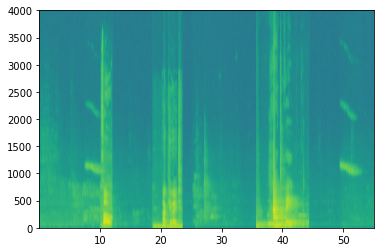

In [10]:
x = graph_spectrogram("audio_examples/example_train.wav") #This graph  represents how active each frequency is (y axis) over a number of time-steps (x axis). 


In [11]:
_, data = wavfile.read("audio_examples/example_train.wav")  # wavfile.read works with rate and data
print("Time steps in audio recording before spectrogram", data[:0].shape)
print("Time steps in input after spectrogram", x.shape)

Time steps in audio recording before spectrogram (0, 2)
Time steps in input after spectrogram (101, 5511)


In [12]:
# from above we can define that 
Tx = 5511 # The number of time steps input to the model from the spectrogram
n_freq = 101 # Number of frequencies input to the model at each time step of the spectrogram

In [13]:
Ty = 1375 # The number of time steps in the output of our model

In [14]:
# Load audio segments using pydub for a single example
activates, negatives, backgrounds = load_raw_audio('./raw_data/')

print("background len should be 10,000, since it is a 10 sec clip\n" + str(len(backgrounds[0])),"\n")
print("activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) \n" + str(len(activates[0])),"\n")
print("activate[1] len: different `activate` clips can have different lengths\n" + str(len(activates[1])),"\n")

background len should be 10,000, since it is a 10 sec clip
10000 

activate[0] len may be around 1000, since an `activate` audio clip is usually around 1 second (but varies a lot) 
916 

activate[1] len: different `activate` clips can have different lengths
668 



In [15]:
def get_random_time_segment(segment_ms):
    """
    Gets a random time segment of duration segment_ms in a 10,000 ms audio clip.
    
    Arguments:
    segment_ms -- the duration of the audio clip in ms ("ms" stands for "milliseconds")
    
    Returns:
    segment_time -- a tuple of (segment_start, segment_end) in ms
    """
    
    segment_start = np.random.randint(low=0, high=10000-segment_ms)   #suring that segment doesn't run past the 10sec background 
    segment_end = segment_start + segment_ms - 1
    
    return (segment_start, segment_end)

In [16]:

def is_overlapping(segment_time, previous_segments):
    """
    Checking if the time of a segment overlaps with the times of existing segments.
    
    Arguments:
    segment_time -- a tuple of (segment_start, segment_end) for the new segment
    previous_segments -- a list of tuples of (segment_start, segment_end) for the existing segments
    
    Returns:
    True if the time segment overlaps with any of the existing segments, False otherwise
    """
    
    segment_start, segment_end = segment_time
    
    # Initializing overlap as a "False" flag
    overlap = False
    
    #looping over the previous_segments start and end times.
    #Comparing start/end times and set the flag to True if there is an overlap
    for previous_start, previous_end in previous_segments: 
        if segment_start<=previous_end and segment_end >= previous_start:
            overlap = True
            break

    return overlap

In [17]:
#checking overlap
overlap1 = is_overlapping((950, 1430), [(2000, 2550), (260, 949)])
overlap2 = is_overlapping((2305, 2950), [(824, 1532), (1900, 2305), (3424, 3656)])
print("Overlap 1 = ", overlap1)
print("Overlap 2 = ", overlap2)

Overlap 1 =  False
Overlap 2 =  True


In [19]:
#inserting audio clip
def insert_audio_clip(background, audio_clip, previous_segments):
    """
    Inserting a new audio segment over the background noise at a random time step, ensuring that the 
    audio segment does not overlap with existing segments.
    
    Arguments:
    background -- a 10 second background audio recording.  
    audio_clip -- the audio clip to be inserted/overlaid. 
    previous_segments -- times where audio segments have already been placed
    
    Returns:
    new_background -- the updated background audio
    """
    
    # Get the duration of the audio clip in ms
    segment_ms = len(audio_clip)
     
    # Use one of the helper functions to pick a random time segment onto which to insert 
    # the new audio clip
    segment_time = get_random_time_segment(segment_ms)
    
    # Checking if the new segment_time overlaps with one of the previous_segments. If so, keep 
    # picking new segment_time at random until it doesn't overlap. To avoid an endless loop
    # we retry 5 times
    retry = 5 
    while is_overlapping(segment_time, previous_segments) and retry >= 0:
        segment_time = get_random_time_segment(segment_ms)
        retry = retry - 1
        #print(segment_time)
    # if last try is not overlaping, insert it to the background
    if not is_overlapping(segment_time, previous_segments):
        # Appending the new segment_time to the list of previous_segments
        previous_segments.append(segment_time)
        
        # Superpose audio segment and background
        new_background = background.overlay(audio_clip, position = segment_time[0])
    else:
        #print("Timeouted")
        new_background = background
        segment_time = (10000, 10000)
    
    return new_background, segment_time

In [20]:
#checking
np.random.seed(5)
audio_clip, segment_time = insert_audio_clip(backgrounds[0], activates[0], [(3790, 4400)])
audio_clip.export("insert_test.wav", format="wav")
print("Segment Time: ", segment_time)
IPython.display.Audio("insert_test.wav")

Segment Time:  (2254, 3169)


In [21]:
#inserting ones
def insert_ones(y, segment_end_ms):
    """
    Update the label vector y. The labels of the 50 output steps strictly after the end of the segment 
    should be set to 1. By strictly we mean that the label of segment_end_y should be 0 while, the
    50 following labels should be ones.
    
    
    Arguments:
    y -- numpy array of shape (1, Ty), the labels of the training example
    segment_end_ms -- the end time of the segment in ms
    
    Returns:
    y -- updated labels
    """
    _, Ty = y.shape
    
    # duration of the background (in terms of spectrogram time-steps)
    segment_end_y = int(segment_end_ms * Ty / 10000.0)
    
    if segment_end_y < Ty:
        # Adding 1 to the correct index in the background label (y)
        for i in range(segment_end_y+1,segment_end_y+51 ):
            if i < Ty:
                y[0, i] = 1
    return y

sanity checks: 0.0 1.0 0.0


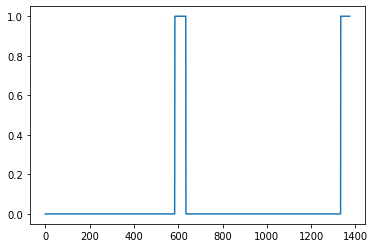

In [22]:
#checking
arr1 = insert_ones(np.zeros((1, Ty)), 9700)
plt.plot(insert_ones(arr1, 4251)[0,:])
print("sanity checks:", arr1[0][1333], arr1[0][634], arr1[0][635])

In [23]:
# createing training example

def create_training_example(background, activates, negatives, Ty):
    """
    Creates a training example with a given background, activates, and negatives.
    
    Arguments:
    background -- a 10 second background audio recording
    activates -- a list of audio segments of the word "activate"
    negatives -- a list of audio segments of random words that are not "activate"
    Ty -- The number of time steps in the output

    Returns:
    x -- the spectrogram of the training example
    y -- the label at each time step of the spectrogram
    """
    
    # Make background quieter
    background = background - 20

    # Initializing y (label vector) of zeros
    y = np.zeros((1, Ty))

    # Initializing segment times as empty list (≈ 1 line)
    previous_segments = []
    
    # Selecting 0-4 random "activate" audio clips from the entire list of "activates" recordings
    number_of_activates = np.random.randint(0, 5)
    random_indices = np.random.randint(len(activates), size=number_of_activates)
    random_activates = [activates[i] for i in random_indices]
    
    #Looping over randomly selected "activate" clips and insert in background
    for random_activate in random_activates: 
        # Inserting the audio clip on the background
        background, segment_time = insert_audio_clip(background, random_activate, previous_segments)
        # Retrieving segment_start and segment_end from segment_time
        segment_start, segment_end = segment_time
        # Inserting labels in "y" at segment_end
        y = insert_ones(y, segment_end)
    
    # Select 0-2 random negatives audio recordings from the entire list of "negatives" recordings
    number_of_negatives = np.random.randint(0, 3)
    random_indices = np.random.randint(len(negatives), size=number_of_negatives)
    random_negatives = [negatives[i] for i in random_indices]

    #Looping over randomly selected negative clips and insert in background
    for random_negative in random_negatives:
        # Inserting the audio clip on the background 
        background, _ = insert_audio_clip(background, random_negative, previous_segments)
   
    # Standardize the volume of the audio clip 
    background = match_target_amplitude(background, -20.0)

    # Export new training example 
    file_handle = background.export("train" + ".wav", format="wav")
    
    # Get and ploting spectrogram of the new recording (background with superposition of positive and negatives)
    x = graph_spectrogram("train.wav")
    
    return x, y

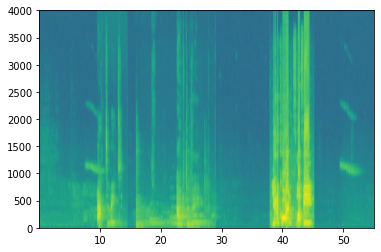

In [24]:
# Set the random seed
np.random.seed(18)
x, y = create_training_example(backgrounds[0], activates, negatives, Ty)

In [25]:
#Now we can listen to the training example you created and compare it to the spectrogram generated above.

In [26]:
IPython.display.Audio("train.wav")

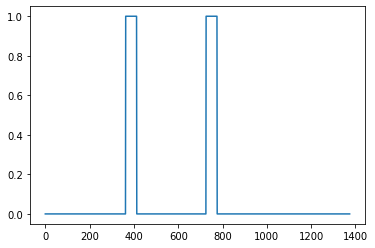

In [27]:
plt.plot(y[0])

#Model

In [28]:
from tensorflow.keras.callbacks import ModelCheckpoint
from tensorflow.keras.models import Model, load_model, Sequential
from tensorflow.keras.layers import Dense, Activation, Dropout, Input, Masking, TimeDistributed, LSTM, Conv1D
from tensorflow.keras.layers import GRU, Bidirectional, BatchNormalization, Reshape
from tensorflow.keras.optimizers import Adam

In [29]:
def modelf(input_shape):
    """
    Function creating the model's graph in Keras.
    
    Argument:
    input_shape -- shape of the model's input data (using Keras conventions)

    Returns:
    model -- Keras model instance
    """
    
    X_input = Input(shape = input_shape)
    
    X = Conv1D(filters = 196, kernel_size = 15, strides = 4)(X_input)
    X = BatchNormalization()(X)
    X = Activation('relu')(X)
    X = Dropout(rate = 0.8)(X)                                  
    X = GRU(128, return_sequences = True)(X)
    X = Dropout(rate = 0.8)(X)
    X = BatchNormalization()(X)                           
        
    X = GRU(128, return_sequences = True)(X)
    X = Dropout(rate = 0.8)(X)       
    X = BatchNormalization()(X)
    X = Dropout(rate = 0.8)(X)                                 
    
    X = TimeDistributed(Dense(1, activation = 'sigmoid'))(X)

    
    model = Model(inputs = X_input, outputs = X)
    
    return model  

In [30]:
model = modelf(input_shape = (Tx, n_freq))

In [31]:
model.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 5511, 101)]       0         
                                                                 
 conv1d (Conv1D)             (None, 1375, 196)         297136    
                                                                 
 batch_normalization (BatchN  (None, 1375, 196)        784       
 ormalization)                                                   
                                                                 
 activation (Activation)     (None, 1375, 196)         0         
                                                                 
 dropout (Dropout)           (None, 1375, 196)         0         
                                                                 
 gru (GRU)                   (None, 1375, 128)         125184    
                                                             

#Fitting the model

0
10
20
30


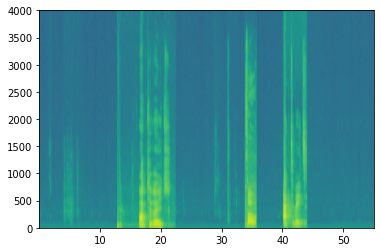

In [37]:
np.random.seed(4543)
nsamples = 32
X = []
Y = []
for i in range(0, nsamples):
    if i%10 == 0:
        print(i)
    x, y = create_training_example(backgrounds[i % 2], activates, negatives, Ty)
    X.append(x.swapaxes(0,1))
    Y.append(y.swapaxes(0,1))
X = np.array(X)
Y = np.array(Y)


In [38]:

#Block Training for BatchNormalization Layers
model.layers[2].trainable = False
model.layers[7].trainable = False
model.layers[10].trainable = False

In [39]:
opt = Adam(lr=1e-6, beta_1=0.9, beta_2=0.999)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=["accuracy"])

In [45]:
model.fit(X, Y, batch_size = 16, epochs=1)

2/2 [==============================] - 5s 3s/step - loss: 1.1599 - accuracy: 0.5153


In [46]:
# Loading preprocessed dev set examples
X_dev = np.load("./XY_dev/X_dev.npy")
Y_dev = np.load("./XY_dev/Y_dev.npy")

In [47]:
#testing
loss, acc, = model.evaluate(X_dev, Y_dev)
print("Dev set accuracy = ", acc)

1/1 [==============================] - 1s 1s/step - loss: 0.6831 - accuracy: 0.6075
Dev set accuracy =  0.6075054407119751


In [48]:
def detect_triggerword(filename):
    plt.subplot(2, 1, 1)
    
    # Correct the amplitude of the input file before prediction 
    audio_clip = AudioSegment.from_wav(filename)
    audio_clip = match_target_amplitude(audio_clip, -20.0)
    file_handle = audio_clip.export("tmp.wav", format="wav")
    filename = "tmp.wav"

    x = graph_spectrogram(filename)
    # the spectrogram outputs (freqs, Tx) and we want (Tx, freqs) to input into the model
    x  = x.swapaxes(0,1)
    x = np.expand_dims(x, axis=0)
    predictions = model.predict(x)
    
    plt.subplot(2, 1, 2)
    plt.plot(predictions[0,:,0])
    plt.ylabel('probability')
    plt.show()
    return predictions

In [49]:
#chime output
chime_file = "audio_examples/chime.wav"
def chime_on_activate(filename, predictions, threshold):
    audio_clip = AudioSegment.from_wav(filename)
    chime = AudioSegment.from_wav(chime_file)
    Ty = predictions.shape[1]
    #Initializing the number of consecutive output steps to 0
    consecutive_timesteps = 0
    #Looping over the output steps in the y
    for i in range(Ty):
        #Incrementing consecutive output steps
        consecutive_timesteps += 1
        #If prediction is higher than the threshold and more than 20 consecutive output steps have passed
        if consecutive_timesteps > 20:
            #Superpose audio and background using pydub
            audio_clip = audio_clip.overlay(chime, position = ((i / Ty) * audio_clip.duration_seconds) * 1000)
            #Reseting consecutive output steps to 0
            consecutive_timesteps = 0
        # if amplitude is smaller than the threshold reset the consecutive_timesteps counter
        if predictions[0, i, 0] < threshold:
            consecutive_timesteps = 0
        
    audio_clip.export("chime_output.wav", format='wav')

In [50]:
IPython.display.Audio("./raw_data/dev/1.wav")

1/1 [==============================] - 0s 163ms/step


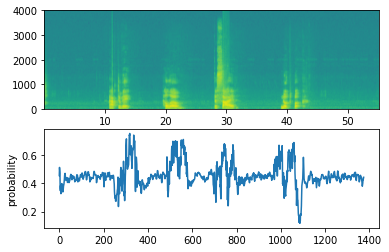

In [54]:
#checking
filename = "./raw_data/dev/1.wav"
prediction = detect_triggerword(filename)
chime_on_activate(filename, prediction, 0.5)
IPython.display.Audio("./chime_output.wav")